# <center > Analysis of Zillow Home Value Index across Time and Location <center>
 <center> Gaurav Rimal, Mike Lupo, Sean Moadel<center>

## Introduction:

Moving is something that almost everyone experiences at least once in their lifetime. Whether it be for a job, family, or any other reason, it is important to understand the current state of the housing market. As college students who will soon be looking for jobs, understanding the housing market is important for us to consider while we think about relocation. This topic should not only be important to us, but everyone who is considering moving especially now with the current tightness of the housing market. 

According to the Federal Reserve, the housing market has tightened considerably. The supply of homes available for sale has fallen to historically low levels and home price growth has increased greatly during the pandemic. In this tutorial, we aim to analyze how home values have changed in the 21st century across the United States. We will be measuring the changes in Zillow Home Value Index (ZHVI) which is a seasonally adjusted measure of typical home value and market changes.

ZHVI is a measure provided by Zillow Inc. that measures two key variables in the current housing market as well as over time. These two variables are home value and housing market appreciation. For more details about ZHVI and how it is calculated, visit [this link.](https://www.zillow.com/research/zhvi-methodology-2019-deep-26226/) Another link that may be helpful is the [ZHVI User Guide.](https://www.zillow.com/research/zhvi-user-guide/)

Using the ZHVI dataset, our goal is to predict future ZHVI and see whether whether the size of the region affects its ZHVI. In order to do this, we will be going through the data science lifecycle which has five parts:
1. Data Collection
2. Data Processing
3. Exploratory Analysis and Data Visualization 
4. Analysis, Hypothesis Testing, and Machine Learning
5. Insight and Policy Decision 


## Table of Contents

* [Data Collection](#collection)
* [Data Processing](#processing)
* [Exploratory Analysis & Data Visualization](#viz)
* [Analysis, Hypothesis Testing, & ML](#testing)
* [Interpretation: Insight & Policy Decision](#insight)

## Data Collection <a class="anchor" id="collection"></a>
This data was obtained from https://www.zillow.com/research/data/ under Home Values.

First, let's import some libraries that will be using:
- Numpy supports large multidimensional matrices and high-level mathematical functions.
- Pandas is open source data analysis and manipulation tool through use of dataframes.
- Matplotlib supports static, animated and interactive visualization of data.
- Sklearn offers various classification, regression and clustering algorithms.

If you do not have any of these libraries installed, you can install them by entering ```  pip3 install [package] ```. If you need any more information, you can see the documentation or a tutorial for each library listed below: 
- [Numpy Documentation](https://numpy.org/doc/) - [Numpy Tutorial](https://www.w3schools.com/python/numpy/default.asp)
- [Pandas Documentation](https://pandas.pydata.org/docs/) - [Pandas Tutorial](https://www.w3schools.com/python/pandas/default.asp)
- [Matplotlib Documentation](https://matplotlib.org/stable/tutorials/introductory/usage.html) - [Matplotlib Tutorial](https://www.w3schools.com/python/matplotlib_intro.asp)
- [Sklearn Documentation](https://scikit-learn.org/0.21/documentation.html) - [Sklearn Tutorial](https://www.tutorialspoint.com/scikit_learn/index.htm)


In [83]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import sklearn
import seaborn as sns
import statsmodels.formula.api

In [84]:
raw_data = pd.read_csv("data.csv")
raw_data.head()

,RegionID,SizeRank,RegionName,RegionType,StateName,2000-01-31,2000-02-29,2000-03-31,2000-04-30,2000-05-31,...,2021-02-28,2021-03-31,2021-04-30,2021-05-31,2021-06-30,2021-07-31,2021-08-31,2021-09-30,2021-10-31,2021-11-30
0,102001,0,United States,Country,NaN,127104.0,127448.0,127809.0,128546.0,129288.0,...,274766.0,278419.0,282276.0,286980.0,292503.0,298382.0,303772.0,308393.0,312486.0,316368.0
1,394913,1,"New York, NY",Msa,NY,223875.0,225213.0,226416.0,228785.0,230991.0,...,520343.0,524700.0,529431.0,534932.0,542083.0,549998.0,557578.0,563469.0,568010.0,571556.0
2,753899,2,"Los Angeles-Long Beach-Anaheim, CA",Msa,CA,231151.0,231956.0,233189.0,235533.0,238046.0,...,748563.0,756432.0,767475.0,783139.0,802944.0,823842.0,837285.0,846395.0,851153.0,858357.0
3,394463,3,"Chicago, IL",Msa,IL,169017.0,169416.0,169932.0,170965.0,172060.0,...,258870.0,260970.0,263993.0,266728.0,270524.0,274664.0,278755.0,281808.0,284452.0,287131.0
4,394514,4,"Dallas-Fort Worth, TX",Msa,TX,130276.0,130380.0,130466.0,130678.0,130900.0,...,280524.0,284541.0,290061.0,296469.0,303787.0,311586.0,319478.0,326661.0,332734.0,338194.0


## Data Processing <a class="anchor" id="processing"></a>

Now, let's clean the data so we can extract only the relevant details such as Dates, Locations and the ZHVI. By getting rid of unecessary information, we get a much cleaner dataset that is easier to read. 

In [85]:
# Melting the dates and converting dates to datetime 
data = raw_data.melt(id_vars=["RegionName", "StateName", "RegionID", "SizeRank", "RegionType"], 
        var_name = "Date", 
        value_name ="Zillow Home Value Index")
data["Date"] = pd.to_datetime(data['Date'], format='%Y/%m/%d')
# Dropping unnecessary columns 
data.drop(["RegionID", "RegionType"], axis = 1, inplace = True)
data.dropna(subset = ["StateName"], inplace = True)
data.head()

,RegionName,StateName,SizeRank,Date,Zillow Home Value Index
1,"New York, NY",NY,1,2000-01-31,223875.0
2,"Los Angeles-Long Beach-Anaheim, CA",CA,2,2000-01-31,231151.0
3,"Chicago, IL",IL,3,2000-01-31,169017.0
4,"Dallas-Fort Worth, TX",TX,4,2000-01-31,130276.0
5,"Philadelphia, PA",PA,5,2000-01-31,129615.0


The data now looks clean but there could be some missing values. Let's check! Using the Pandas library, we can check if there are any missing values in the dataframe using the code below. 

In [86]:
data["Zillow Home Value Index"].isna().sum()

48727

In order to impute the missing values, we are going to calculate the average ZHVI for the whole state on that date.

In [87]:
# in order to impute the n/a values, calculate the avg index for that state on that date
avg_state_date = data.groupby(["StateName", "Date"]).mean()
avg_state_date.reset_index(level = ["StateName", "Date"], inplace = True)
avg_state_date.rename(columns ={"Zillow Home Value Index": "Average Zillow Home Value Index for State on Date"}, inplace = True)
avg_state_date.drop(["SizeRank"], axis = 1, inplace = True)

In [88]:
# Merging back to original dataframe and filling the holes
data = pd.merge(data, avg_state_date, how = "left", on = ["StateName", "Date"])
data["Zillow Home Value Index"].fillna(data["Average Zillow Home Value Index for State on Date"], inplace = True)
data["Zillow Home Value Index"].isna().sum()

3468

There are still some missing values. Let's fill those with average ZHVI for the whole region across our window of time. After we fill in these values, we now have 0 missing values and our dataset is almost ready to be explored. 

In [89]:
avg_region = data.groupby(["RegionName"]).mean()
avg_region.drop(["Average Zillow Home Value Index for State on Date", "SizeRank"], axis =1, inplace = True)
avg_region.reset_index(level = ["RegionName"], inplace = True)
avg_region.rename(columns ={"Zillow Home Value Index": "Average Zillow Home Value Index for Region across Time"}, inplace = True)
data = pd.merge(data, avg_region, how = "left", on = ["RegionName"])
data["Zillow Home Value Index"].fillna(data["Average Zillow Home Value Index for Region across Time"], inplace = True)
data["Zillow Home Value Index"].isna().sum()

0

Let's just calculate the average ZHVI for states as well.

In [90]:
avg_state = data.groupby(["StateName"]).mean()
avg_state.drop(["Average Zillow Home Value Index for State on Date", "SizeRank", "Average Zillow Home Value Index for Region across Time"], axis = 1, inplace = True)
avg_state.reset_index(level = ["StateName"], inplace = True)
avg_state.rename(columns ={"Zillow Home Value Index": "Average Zillow Home Value Index for State across Time"}, inplace = True)
data = pd.merge(data, avg_state, how = "left", on = ["StateName"])

In [91]:
data.head()

,RegionName,StateName,SizeRank,Date,Zillow Home Value Index,Average Zillow Home Value Index for State on Date,Average Zillow Home Value Index for Region across Time,Average Zillow Home Value Index for State across Time
0,"New York, NY",NY,1,2000-01-31,223875.0,79925.461538,407514.752852,131142.310067
1,"Los Angeles-Long Beach-Anaheim, CA",CA,2,2000-01-31,231151.0,221478.900000,505735.870722,358798.080588
2,"Chicago, IL",IL,3,2000-01-31,169017.0,90254.285714,222440.041825,107777.913740
3,"Dallas-Fort Worth, TX",TX,4,2000-01-31,130276.0,103721.555556,177825.041825,121059.292274
4,"Philadelphia, PA",PA,5,2000-01-31,129615.0,92338.666667,216507.528517,133913.688633


Finally, the data is ready to be disected. Lets move on to anaylsis.

## Exploratory Analysis & Data Visualization <a class="anchor" id="viz"></a>

To start off we are going to visualize how the ZHVI changed per state over time. To do this, we are going to use the Matplotlib library to create a scatterplot with each datapoint on it.

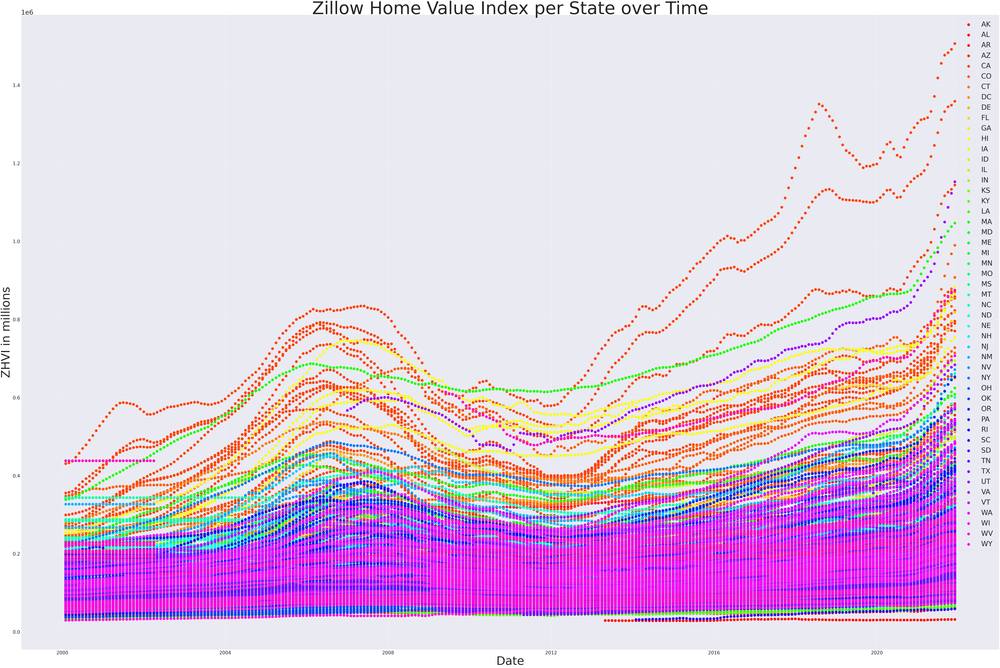

In [92]:
n = data.StateName.nunique()
distinct_colors = plt.cm.gist_rainbow(np.linspace(0, 1, n))
fig, ax = plt.subplots(figsize = (150, 100))
states = data.groupby(["StateName"])
i = 0
for name, group in states:
   
    ax.scatter(x = "Date",y = "Zillow Home Value Index", data = group, label = name, s = 500, color = distinct_colors[i])
    i = i+1
ax.legend(fontsize = 60)
plt.title("Zillow Home Value Index per State over Time", fontsize = 150)
plt.xlabel("Date", fontsize = 100)
plt.xticks(fontsize = 40)
plt.ylabel("ZHVI in millions", fontsize = 100)
plt.yticks(fontsize = 40);

We can see that states like New York and Hawaii have had premium ZHVI for almost all the time. ZHVI seems to peak at times of crisis like the 2008 Recession and the 2019 Covid Pandemic. For more information on the current state of the housing market as a result of COVID-19, visit this [link.](https://www.federalreserve.gov/econres/notes/feds-notes/housing-market-tightness-during-covid-19-increased-demand-or-reduced-supply-20210708.htm)

In [93]:
top = data.nlargest(1000, "Zillow Home Value Index")
top["StateName"].value_counts().head()

CA    603
HI    132
MA     89
CO     73
UT     62
Name: StateName, dtype: int64

The next thing we are going to visualize is the end of year ZHVI for every complete year. This will allow us to see trends in the data that were more difficult to see in our previous graph. 

Text(0.5, 1.0, 'End of year ZHVI for every complete year')

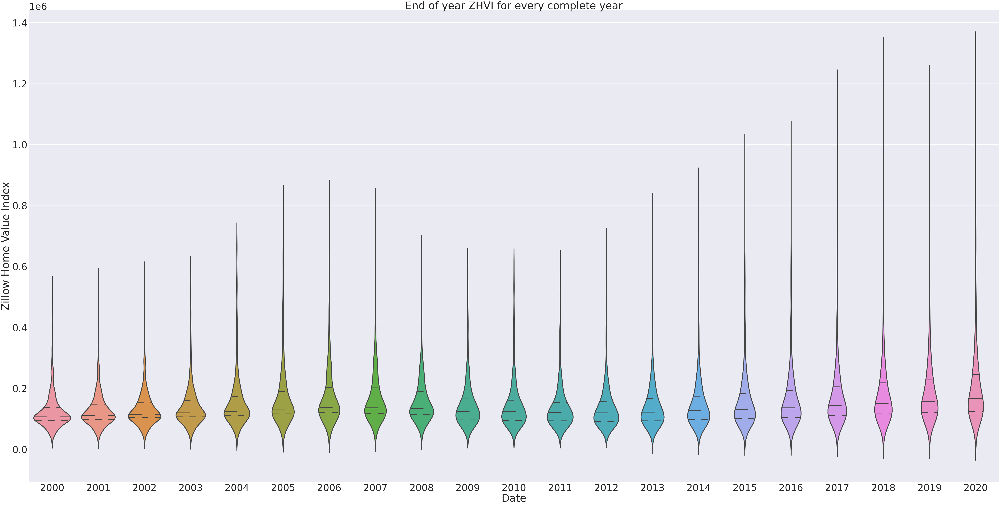

In [94]:
end_of_year = data[data["Date"].dt.month == 12]
sns.set(rc={'figure.figsize':(100,50)})
sns.set(font_scale = 5)
plot = sns.violinplot(x = end_of_year["Date"].dt.year, y = "Zillow Home Value Index", data = end_of_year, inner = "quartile", linewidth = 5)
plot.set_title("End of year ZHVI for every complete year")

The average ZHVI for the Year has a net increase from 2000 to 2020. The spread of ZHVI is also getting much bigger than we have seen in the earlier part of the decade.

Lets look at average ZHVI per region size:

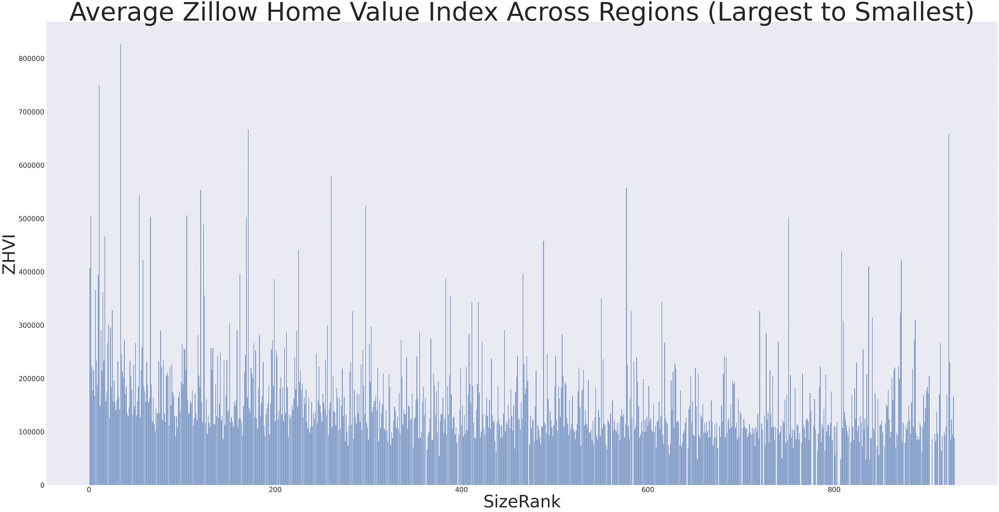

In [95]:
n = data.SizeRank.nunique();
regions = data.head(n)
plt.rcParams["figure.figsize"] = (100,50)
plt.bar(x = regions["SizeRank"], height = regions["Average Zillow Home Value Index for Region across Time"])
plt.title("Average Zillow Home Value Index Across Regions (Largest to Smallest)", fontsize = 150)
plt.xlabel("SizeRank", fontsize = 100)
plt.xticks(fontsize = 40)
plt.ylabel("ZHVI", fontsize = 100)
plt.yticks(fontsize = 40);

From this visualization we can see that the region size does not seem to have a connection with ZHVI. There are small, large, and medium sized regions with high ZHVIs which suggests that the relationship between region size and ZHVI is very weak if existent at all. 

The last thing we are going to visualize is the average ZHVI across states. From this graph we will be able to see which of the states have the highest ZHVI values. 

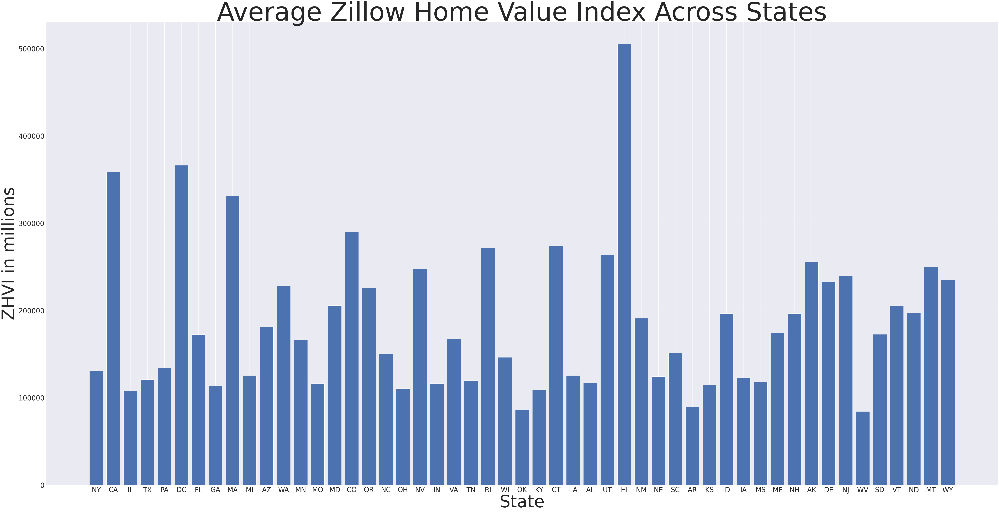

In [96]:
states = data.drop_duplicates("StateName")
plt.rcParams["figure.figsize"] = (100,50)
plt.bar(x = states["StateName"], height = states["Average Zillow Home Value Index for State across Time"])
plt.title("Average Zillow Home Value Index Across States", fontsize = 150)
plt.xlabel("State", fontsize = 100)
plt.xticks(fontsize = 40)
plt.ylabel("ZHVI in millions", fontsize = 100)
plt.yticks(fontsize = 40);

Hawaii, DC, California and Massachusetts have some of the most valuable homes. It is no surprise that Hawaii has the highest ZHVI due to it being a tropical area. The same applies for California which is also known for sunshine and palm trees. This suggests that things like climate and weather may have a connection to ZHVI, which is something that we could test in the future. 

## Analysis, Hypothesis Testing, & ML <a class="anchor" id="testing"></a>

The fourth step in the data science lifecycle is analysis, hypothesis testing, and machine learning. In this part, we are going to use the data and determine if we should reject or fail to reject our hypothesis. 

To start off, we are going to create a polynomial model for our data that shows ZHVI versus region size rank. 

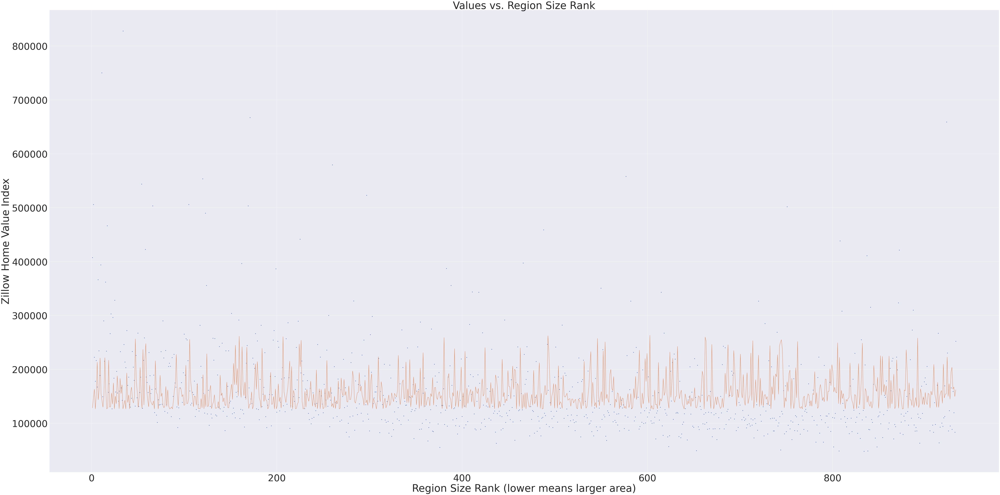

In [97]:
size_ranks = data.groupby('RegionName')['SizeRank'].mean()
values = data.groupby('RegionName')['Zillow Home Value Index'].mean()

# Fit a polynomial to the data
z = np.polyfit(size_ranks, values, 4, rcond=None, full=False, w=None, cov=False)
p = np.polyval(z, size_ranks)

xp = np.linspace(min(size_ranks), max(size_ranks), len(size_ranks))
plt.title('Values vs. Region Size Rank')
plt.xlabel('Region Size Rank (lower means larger area)')
plt.ylabel('Zillow Home Value Index')
plt.plot(size_ranks, values, '.', xp, p, '-');


In [98]:
n = data.SizeRank.nunique()
regions = data.head(n)
regions.rename(columns = {"Average Zillow Home Value Index for Region across Time":"AvgZHVI"}, inplace = True)
mod = statsmodels.formula.api.ols(formula = "(AvgZHVI) ~ SizeRank", data = regions).fit()
mod.summary()

/opt/conda/lib/python3.9/site-packages/pandas/core/frame.py:5034: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  return super().rename(


<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                AvgZHVI   R-squared:                       0.084
Model:                            OLS   Adj. R-squared:                  0.083
Method:                 Least Squares   F-statistic:                     82.87
Date:                Sun, 19 Dec 2021   Prob (F-statistic):           5.50e-19
Time:                        20:35:36   Log-Likelihood:                -11507.
No. Observations:                 903   AIC:                         2.302e+04
Df Residuals:                     901   BIC:                         2.303e+04
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   2.005e+05   5472.487     36.639      0.000     1.9e+05    2.11e+05
SizeRank     -94.2685     10.355     -9.104      0.000    -114.592     -73.946
==============================================================================
Omnibus:                      594.688   Durbin-Watson:                   1.904
Prob(Omnibus):                  0.000   Jarque-Bera (JB):             7050.290
Skew:                           2.897   Prob(JB):                         0.00
Kurtosis:                      15.402   Cond. No.                     1.05e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.05e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

## Interpretation: Insight & Policy Decision<a class="anchor" id="insight"></a>


The last part of the data science lifecycle is interpretation. This step involves understanding the data and operations you have done, and coming to conclusions. 

The graph above shows that the model clearly does not fit the data, and the data shows that region size and Zillow Home Value Index do not seem to be correlated. We can see in our OLS model that our r-squared value is 0.084. This low r-squared value suggests that very little of the average ZHVI movement per region is accounted for by region size. 

If we were to do this again, we should find more data and run a similar test to see if we can get a stronger r-squared value. Some examples for variables to use in future tests would be climate, weather, square footage, and many more. 

Due to the poor results of our model, it would be very difficult to predict ZHVI values and the results would probably not be very accurate. 

However, it is still apparent that the housing market hits peak prices during times of crisis, such as the COVID-19 pandemic or the 2008 recession. This is likely a result of people feeling safer in their current homes and not wanting to sell. The law of supply and demand dictates that with less people wanting to sell their homes, the prices will rise which is why we saw the trends that we did in our earlier visualizations. 

## Conclusion 

While the results of our study were inconclusive, we hope you learned the data science lifecycle which can be applied to almost any dataset. 

Throughout this tutorial we have covered how to use a number of data science assets such as pandas, numpy, and matplotlib. We have shown you how to read and clean data, and then visualize it to see trends. We have also shown you how to create a model, run hypothesis tests using that model, and understand your results.

